In [ ]:
import pandas as pd

In [ ]:
from pandas import read_csv

In [ ]:
df = pd.read_csv(r"D:\Data Science\MACHINE LEARNING\train.csv")
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [ ]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


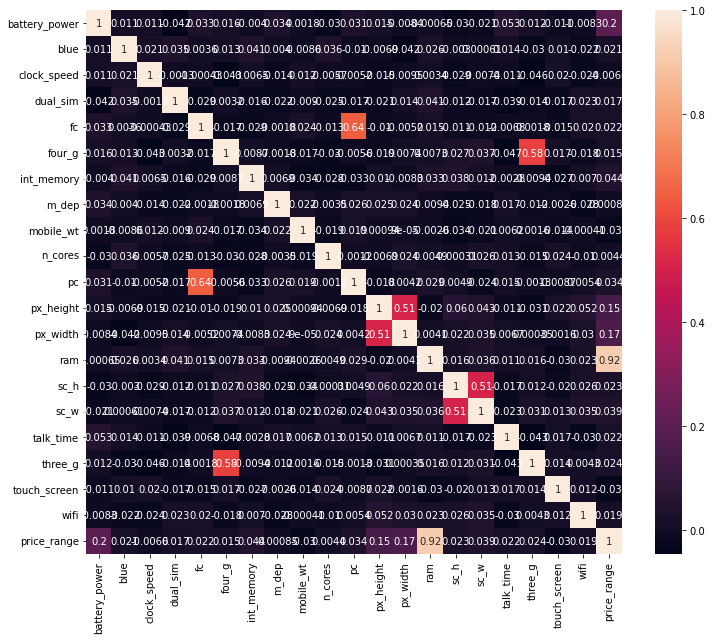

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
corr = df.corr()
f, ax = plt.subplots(figsize = (12,10))
sns.heatmap(corr, annot = True)

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split


In [ ]:
import numpy as np
y = np.array(df['price_range'])
x = df.drop(['price_range'], axis = 1)
from sklearn.preprocessing import MinMaxScaler

In [ ]:
scaler = MinMaxScaler()
x = scaler.fit_transform(x)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 0)


In [ ]:
for i in [1,3,4,10,30,40,60]:
  clf = SVC(kernel = 'linear', C = i).fit(X_train, y_train)
  score = clf.score(X_test, y_test)
  print('C value is :', i, score)

C value is : 1 0.948
C value is : 3 0.952
C value is : 4 0.952
C value is : 10 0.954
C value is : 30 0.956
C value is : 40 0.958
C value is : 60 0.952


In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
clf1 = SVC(kernel = 'linear', C = 20).fit(X_train, y_train)
scores = cross_val_score(clf1, X_train, y_train, cv = 5)
stat_scores = cross_val_score(clf1, X_train, y_train, cv = StratifiedKFold(5))
print('scores', scores)
print('average of validation', scores.mean())

scores [0.97       0.96       0.94666667 0.96333333 0.97333333]
average of validation 0.9626666666666667


In [ ]:
# creditcard(1)

### SVM (Support Vector Machine)

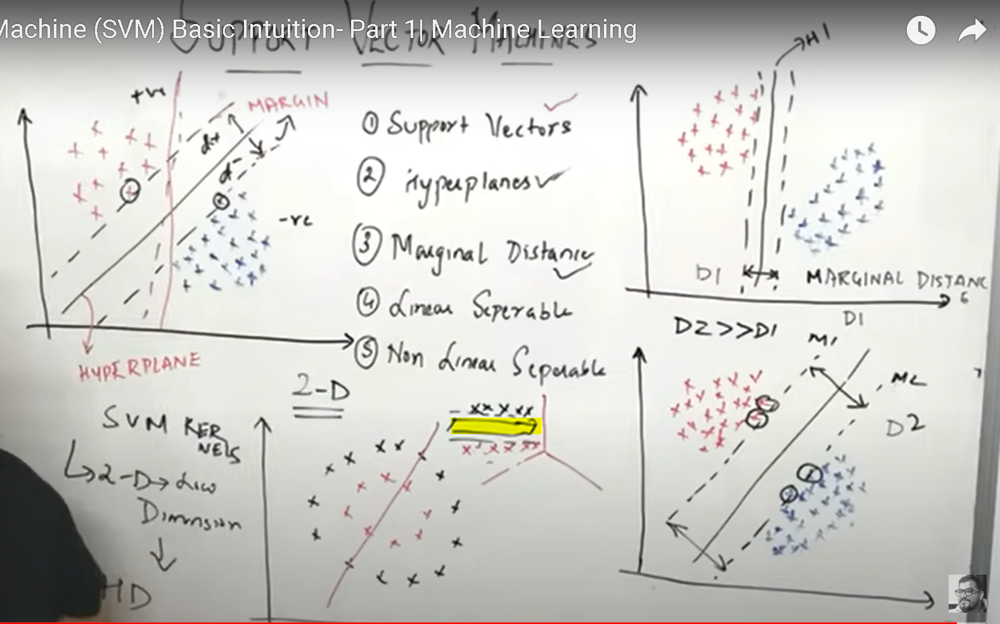

In [ ]:
# SVM is supervised machine learning model and it supports both linear and non linear data
# whichver shows higher margin distance that one will be considered.

In [ ]:
# SVM is won't work well in non linear data for that we have to convert it lower dimension to high dimension 
# or 2 dimension to 3 dimension after that we can create a hyper plane

Math intuition Behind SVM

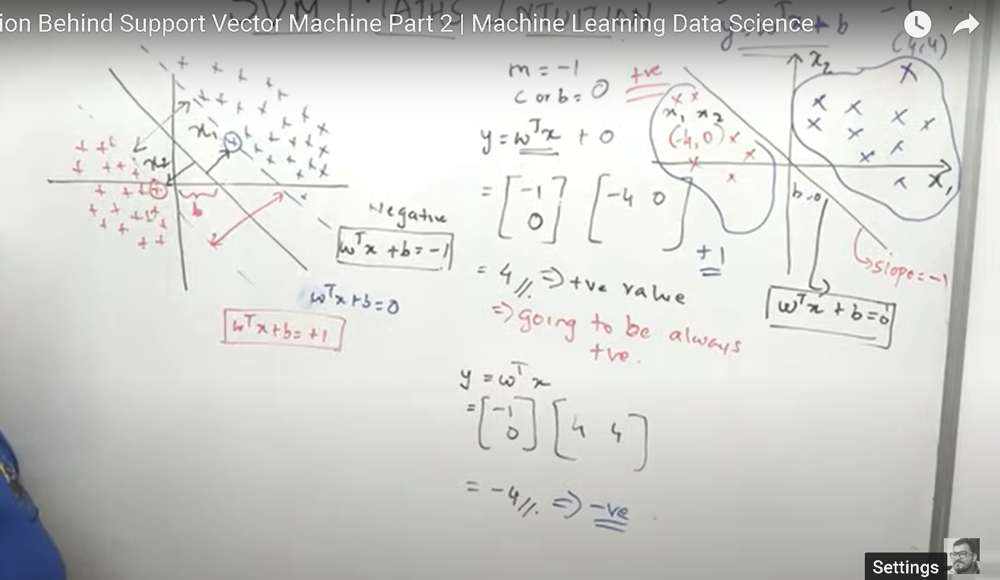

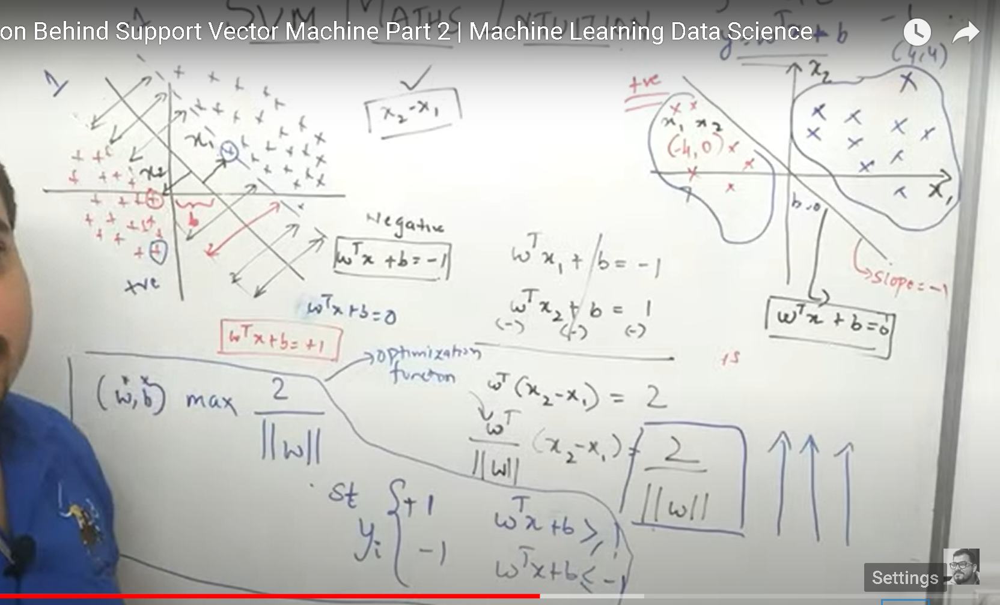

https://www.youtube.com/watch?v=Js3GLb1xPhc

https://www.youtube.com/watch?v=8bFKyb77vp0

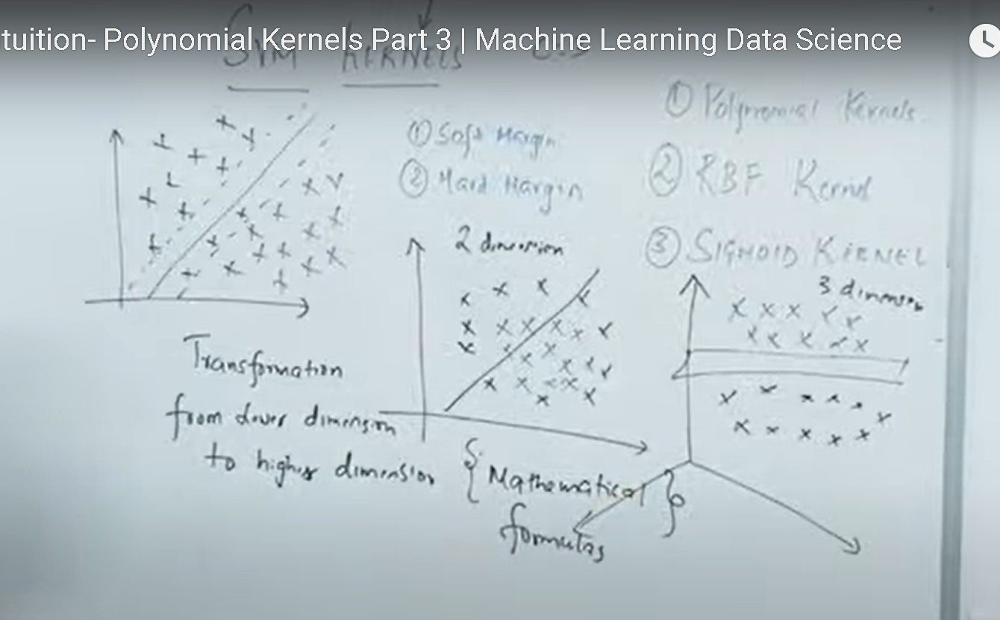

https://www.youtube.com/watch?v=dl_ZsuHSIFE

https://github.com/krishnaik06/SVM-Kernels

https://www.youtube.com/watch?v=hpT7dYsghjM

Live ML Playlist: https://www.youtube.com/playlist?list...

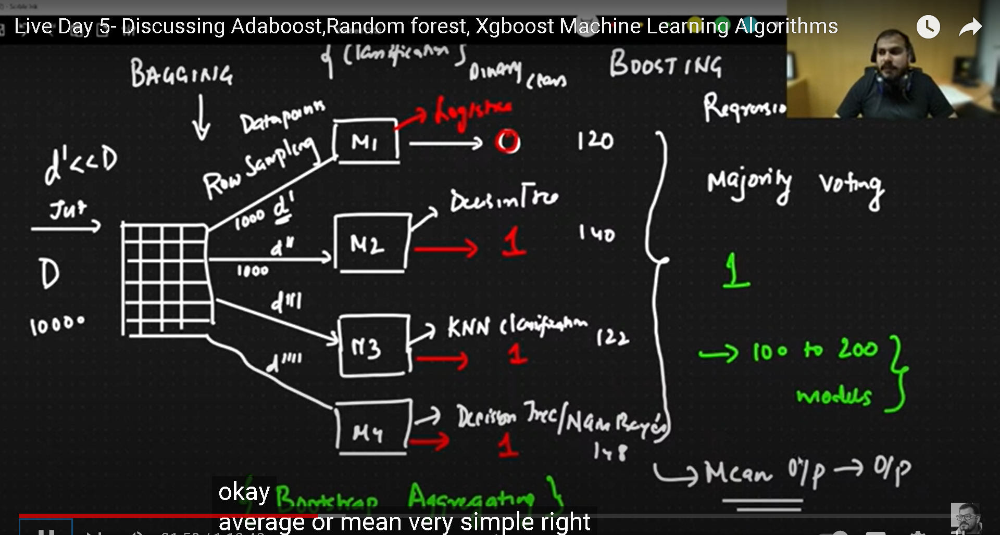

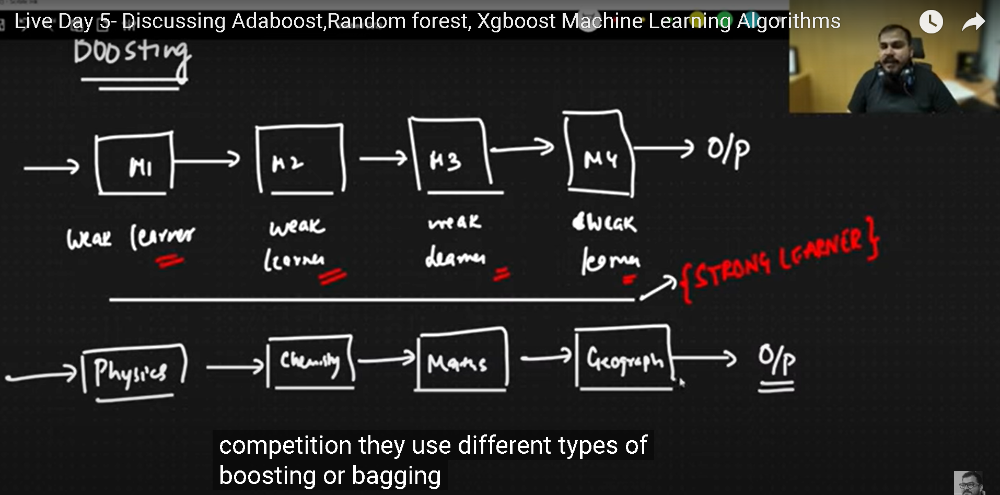

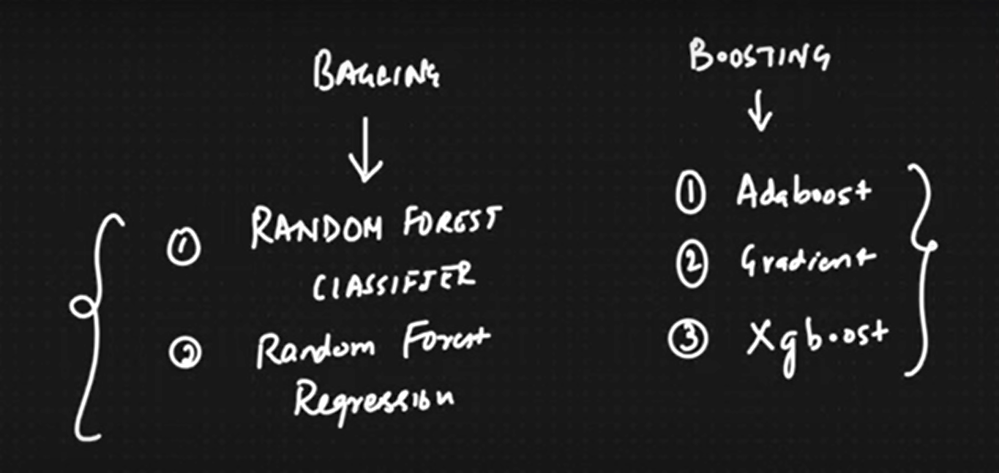

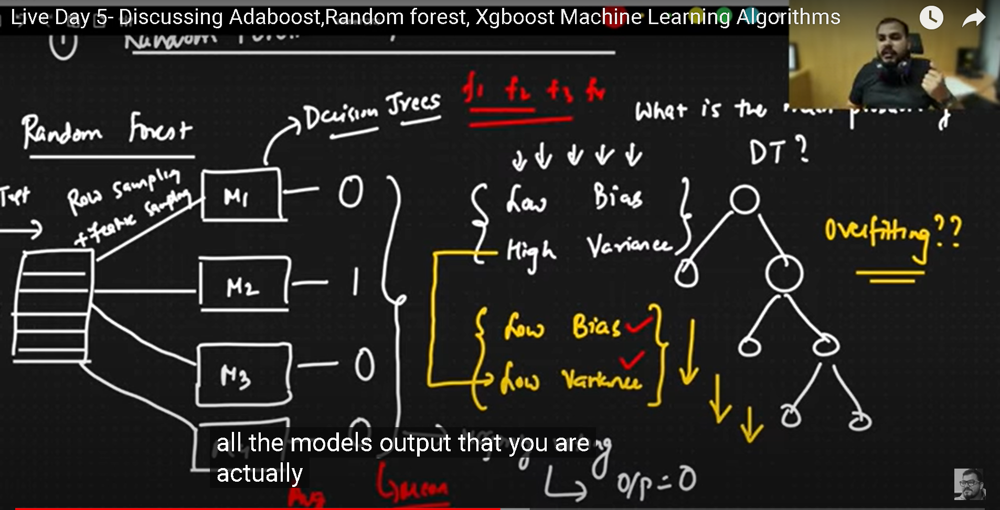

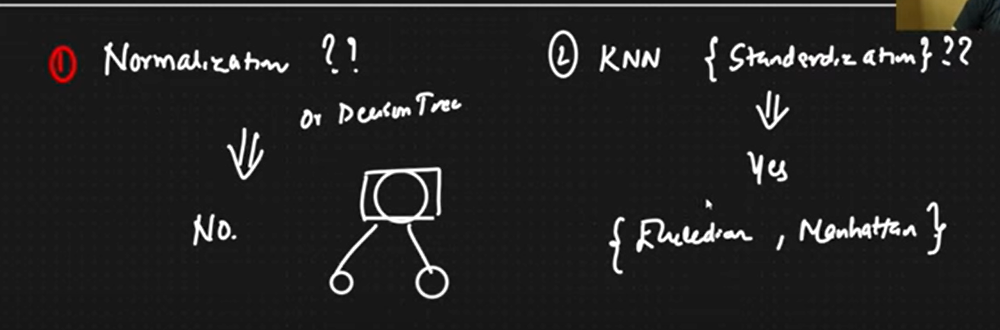

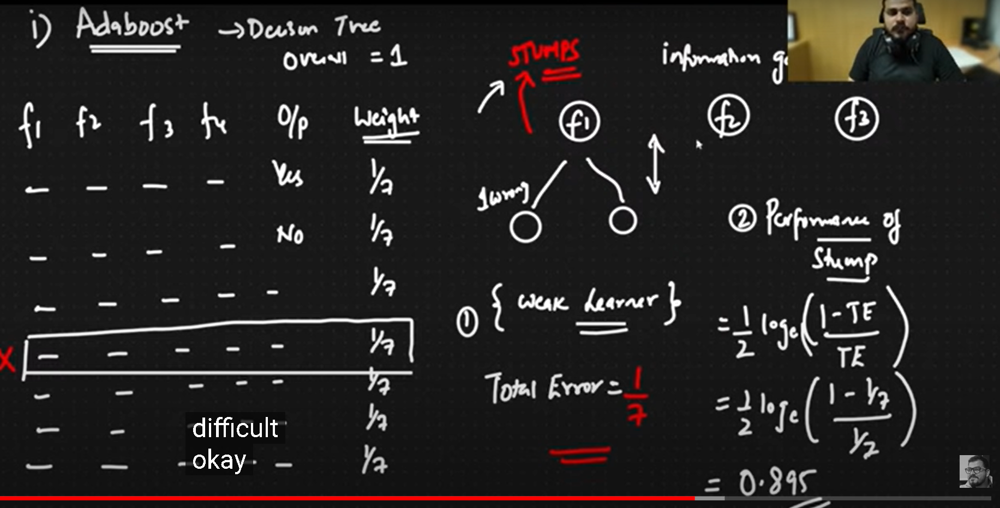

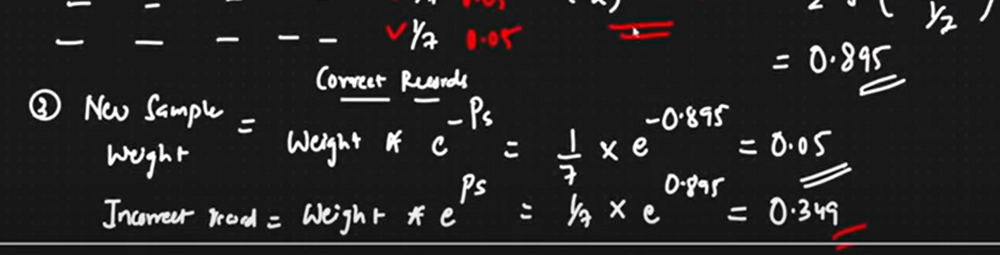

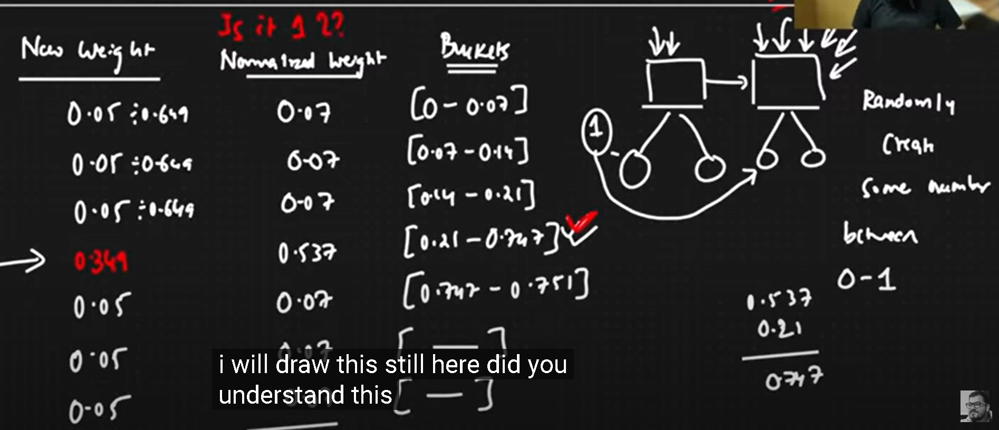

Ada Boosting: https://www.youtube.com/watch?v=NLRO1-jp5F8

Gradient Boosting In Depth Intuition : https://www.youtube.com/watch?v=Nol1hVtLOSg

Gradient Boosting Complete Maths Indepth Intuiton Explained : https://www.youtube.com/watch?v=Oo9q6YtGzvc

Xgboost Classification Indepth Maths Intuition : https://www.youtube.com/watch?v=gPciUPwWJQQ

Xgboost Regression In-Depth Intuition Explained : https://www.youtube.com/watch?v=w-_vmVfpssg

Hyperparameter Optimization for Xgboost : https://www.youtube.com/watch?v=9HomdnM12o4